In [240]:
import pandas as pd
import matplotlib.pyplot as plt
import locale
# format français pour la date
locale.setlocale(locale.LC_TIME, 'fr_FR')
file = 'G:/Mon Drive/PCO/data/'

dtypes = {
    'CRO': str,
    'id_diag': int,
    'id_med': int,
    'nir': str,
    'source':str,
    'operation':str
}

# Chargement des données

## chargement des CRO

In [241]:
# chargement des CRO générés avec deux modèles différents
CRO = pd.read_csv(f'{file}\CROs_df.csv', sep=';', dtype=dtypes)
print('nb de CRO total:', len(CRO))

nb de CRO total: 6456


In [242]:
lignes_manquantes = CRO[CRO.isna().any(axis=1)]
print(lignes_manquantes)

      CRO  id_diag  id_med                     nir  \
131   NaN       36      23  2 1976 08 48741 946 48   
318   NaN       49       3  2 1957 08 97189 959 54   
351   NaN      196      10  2 1938 02 65228 395 85   
374   NaN       57      49  2 1962 11 16926 323 31   
478   NaN      218      53  2 1982 04 44228 865 43   
...   ...      ...     ...                     ...   
6321  NaN       49      71  2 1966 09 61630 095 20   
6323  NaN      196       6  1 1988 03 61257 569 20   
6325  NaN      216      33  1 1970 08 33709 367 06   
6338  NaN      216      71  1 1985 03 17608 818 88   
6440  NaN      216      61  1 1984 02 42264 113 68   

                                  source operation  
131   mistralai/Mistral-7B-Instruct-v0.2   exérèse  
318   mistralai/Mistral-7B-Instruct-v0.2   exérèse  
351   mistralai/Mistral-7B-Instruct-v0.2   exérèse  
374   mistralai/Mistral-7B-Instruct-v0.2   biopsie  
478   mistralai/Mistral-7B-Instruct-v0.2   biopsie  
...                              

In [243]:
CRO = CRO.dropna()
print('nb de CRO total après supp des lignes nan:', len(CRO))
# CRO.id_diag = CRO.id_diag.round(0).astype(int)
# CRO.id_med = CRO.id_med.round(0).astype(int)

nb de CRO total après supp des lignes nan: 6357


## chargements des données annexes (patients, anatomopathologistes, diagnostics)

In [245]:
# chargement des data de patients, anatomopathologistes, diagnostics
dtypes_patients = {
    'name':str,
    'address':str,
    'birthday': str,
    'nir':str
}

dtypes_meds = {
    'name':str,
    'id_med':int
}

dtypes_diag = {
    'organe': str,
    'diagnostic':str,
    'cancer': str,
    'id_diag':int
}

patients = pd.read_csv(f'{file}patients.csv', sep=';', dtype = dtypes_patients)
meds = pd.read_csv(f'{file}anatomopathologists.csv', sep=';', dtype = dtypes_meds)
diagnostics = pd.read_csv(f'{file}diagnostics_v2.csv', sep=';', dtype = dtypes_diag)

In [246]:
patients.head(5)

,name,address,birthday,nir
0,Gilbert Étienne,"49, boulevard de Jacques, 21813 Legendre",15/01/1963,1 1963 01 21813 466 38
1,Joseph Berthelot,"avenue Georges David, 65552 Saint Simone",04/11/1960,1 1960 11 65552 524 96
2,Guillaume Samson,"611, boulevard Rey, 65501 Saint AnneVille",19/06/1948,1 1948 06 65501 880 61
3,Alexandre Clément,"3, boulevard Simon, 74510 Devaux",17/03/1998,1 1998 03 74510 756 57
4,Étienne Techer,"avenue de Munoz, 46329 Giraud",26/07/1993,1 1993 07 46329 513 71


In [247]:
meds.head(5)

,name,id_med
0,Dr Zacharie Mercier,0
1,Dr Olivier Bernier,1
2,Dr Antoine Brunet,2
3,Dr Luc Hamel,3
4,Dr Frédéric Martel,4


In [248]:
diagnostics.head(5)

,id_diag,diagnostic,generation,statut
0,0,abcès,0,Train
1,1,acrodermatite chronique atrophiante,0,Train
2,2,adénocarcinome,0,Train
3,3,adénome tubuleux,0,Train
4,4,adénome tubulovilleux,0,Train


In [249]:
# merge des datas avec les CRO
merge_CRO_patients = pd.merge(CRO, patients, on='nir', how='left')
merge_CRO_meds = pd.merge(merge_CRO_patients, meds, on='id_med', how='left')
merge_CRO_diagnostics = pd.merge(merge_CRO_meds, diagnostics[['id_diag', 'diagnostic']], on='id_diag', how='left')

In [250]:
# vérification que la taille du dataframe de CRO ne changent pas (signe de doublon)
print('taille merge CRO partients', len(merge_CRO_patients))
print('taille merge CRO anatomopathologistes', len(merge_CRO_meds))
print('taille merge CRO diagnoctics', len(merge_CRO_diagnostics))

taille merge CRO partients 6357
taille merge CRO anatomopathologistes 6357
taille merge CRO diagnoctics 6357


In [251]:
df_CRO = merge_CRO_diagnostics.copy()
df_CRO = df_CRO.rename(columns={"name_x": 'name_patient', "name_y": "name_med"})
df_CRO.head(5)

,CRO,id_diag,id_med,nir,source,operation,name_patient,address,birthday,name_med,diagnostic
0,Titre : Compte rendu d'anatomopathologie\nDesc...,97,48,2 1996 11 01427 742 22,mistralai/Mistral-7B-Instruct-v0.2,biopsie,Mathilde Michel,"boulevard Becker, 01427 Diallo",03/11/1996,Dr Isaac Lefebvre,endométriose
1,Titre : Compte Rendu d'Anatomopathologie - Lym...,196,99,2 1976 06 35142 767 92,mistralai/Mistral-7B-Instruct-v0.2,exérèse,Laure Pichon,"60, rue Thomas, 35142 Schneider",14/06/1976,Dr Lorraine Bonneau,lymphome de Burkitt
2,Titre : Compte rendu d'anatomopathologie\nDesc...,49,9,2 2002 03 18587 925 67,mistralai/Mistral-7B-Instruct-v0.2,exérèse,Lorraine Fischer,"chemin de Marion, 18587 Lévêque",15/03/2002,Dr Alexandre Da Costa,carcinome à cellules de Merkel
3,Current Model\nmistralai/Mistral-7B-Instruct-v...,36,90,1 1954 07 47869 832 75,mistralai/Mistral-7B-Instruct-v0.2,biopsie,Denis Marques,"avenue Thierry Lamy, 47869 Saint Françoise",11/07/1954,Dr Nicole Maury,carcinome basocellulaire
4,Titre : Compte rendu d'anatomopathologie\nDesc...,277,23,1 1984 10 61183 946 57,mistralai/Mistral-7B-Instruct-v0.2,biopsie,Adrien Guyon,"60, boulevard Carpentier, 61183 PaulVille",01/10/1984,Dr Vincent Leconte,psoriasis


# EDA

## Nb d'occurence anatomopathologiste

In [252]:
nb_meds = df_CRO.id_med.unique()
print("nb d'anatomopathologiste qui apparaissent dans les CRO:", len(nb_meds))

nb d'anatomopathologiste qui apparaissent dans les CRO: 100


## Nb d'occurence d'un patient

In [253]:
nb_patients = df_CRO.nir.unique()
print("nb de patient qui apparaissent dans les CRO:", len(nb_patients))

nb de patient qui apparaissent dans les CRO: 400


## Répartition des diagnostics

In [254]:
nb_diags = df_CRO.id_diag.unique()
print("nb de diagnostics qui apparaissent dans les CRO:", len(nb_diags))

nb de diagnostics qui apparaissent dans les CRO: 11


Text(0, 0.5, 'Occurence')

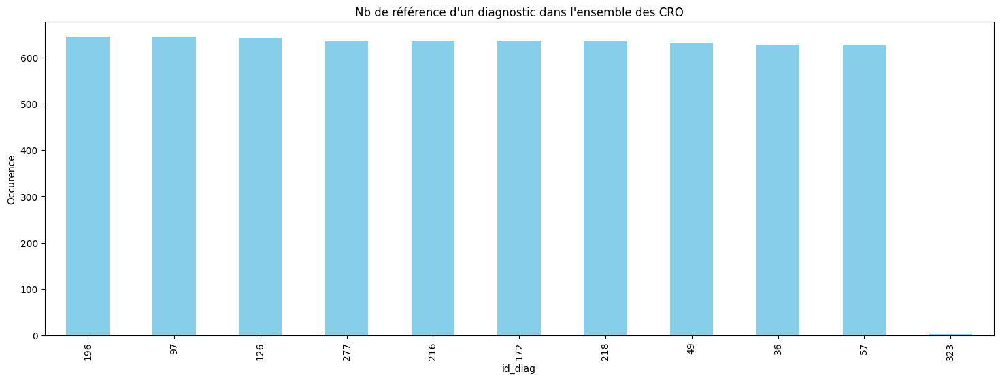

In [255]:
value_counts_diag = df_CRO['id_diag'].value_counts()

plt.figure(figsize=(18, 6))
value_counts_diag.plot(kind='bar', color='skyblue')
plt.title("Nb de référence d'un diagnostic dans l'ensemble des CRO")
plt.xlabel('id_diag')
plt.ylabel('Occurence')

# Langue et Qualité

## Langue

In [256]:
from langdetect import detect_langs

def detect_language_proportion(text: str) -> str:
    """
    renvoie les langues détectées avec le pourcentage de confiance
    """
    try:
        lang_proportions = detect_langs(text)
        response = []
        results = {lang.lang: lang.prob for lang in lang_proportions}
        for lang, proportion in results.items():
            response.append(f"{lang}, {round(proportion, 2)}")
        response = '/'.join(response)
        return response
    except:
        return 'pas de langue détectée'

In [257]:
df_CRO_lang = df_CRO.copy(deep=True)

df_CRO_lang['language_proportions'] = df_CRO_lang.CRO.apply(detect_language_proportion)

In [258]:
df_CRO_lang.head(5)

,CRO,id_diag,id_med,nir,source,operation,name_patient,address,birthday,name_med,diagnostic,language_proportions
0,Titre : Compte rendu d'anatomopathologie\nDesc...,97,48,2 1996 11 01427 742 22,mistralai/Mistral-7B-Instruct-v0.2,biopsie,Mathilde Michel,"boulevard Becker, 01427 Diallo",03/11/1996,Dr Isaac Lefebvre,endométriose,"fr, 1.0"
1,Titre : Compte Rendu d'Anatomopathologie - Lym...,196,99,2 1976 06 35142 767 92,mistralai/Mistral-7B-Instruct-v0.2,exérèse,Laure Pichon,"60, rue Thomas, 35142 Schneider",14/06/1976,Dr Lorraine Bonneau,lymphome de Burkitt,"fr, 1.0"
2,Titre : Compte rendu d'anatomopathologie\nDesc...,49,9,2 2002 03 18587 925 67,mistralai/Mistral-7B-Instruct-v0.2,exérèse,Lorraine Fischer,"chemin de Marion, 18587 Lévêque",15/03/2002,Dr Alexandre Da Costa,carcinome à cellules de Merkel,"fr, 1.0"
3,Current Model\nmistralai/Mistral-7B-Instruct-v...,36,90,1 1954 07 47869 832 75,mistralai/Mistral-7B-Instruct-v0.2,biopsie,Denis Marques,"avenue Thierry Lamy, 47869 Saint Françoise",11/07/1954,Dr Nicole Maury,carcinome basocellulaire,"ca, 1.0"
4,Titre : Compte rendu d'anatomopathologie\nDesc...,277,23,1 1984 10 61183 946 57,mistralai/Mistral-7B-Instruct-v0.2,biopsie,Adrien Guyon,"60, boulevard Carpentier, 61183 PaulVille",01/10/1984,Dr Vincent Leconte,psoriasis,"fr, 1.0"


In [259]:
nb_CRO_en = len(df_CRO_lang.query('language_proportions != "fr, 1.0"'))
print('nb de CRO dans une autre langue (complet ou partiel):', nb_CRO_en, 'soit', round(nb_CRO_en * 100 / len(df_CRO)), '% des CRO générés.')

nb de CRO dans une autre langue (complet ou partiel): 1064 soit 17 % des CRO générés.


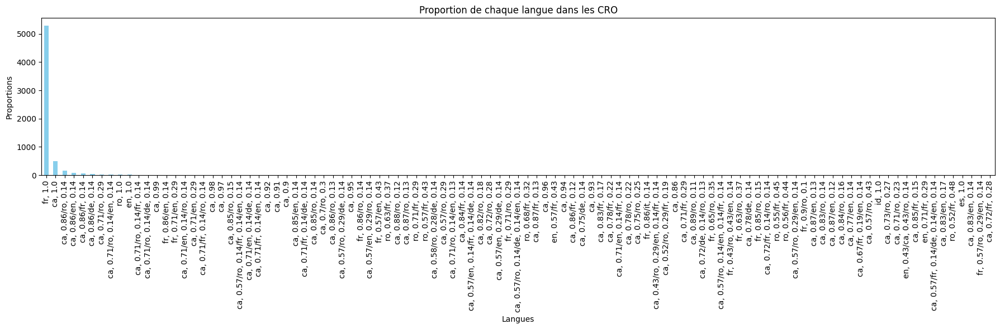

In [260]:
# Comptez les occurrences de chaque valeur dans la colonne
value_counts_lang = df_CRO_lang['language_proportions'].value_counts()

plt.figure(figsize=(18, 6))

# Créez un graphique en barres
value_counts_lang.plot(kind='bar', color='skyblue')
plt.title('Proportion de chaque langue dans les CRO')
plt.xlabel('Langues')
plt.ylabel('Proportions')

plt.tight_layout()

In [261]:
CRO_non_fr = df_CRO_lang.query('language_proportions != "fr, 1.0"').reset_index()
for index in range(0, len(CRO_non_fr)):
    print(CRO_non_fr.CRO[index], '\n')

Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

Titre : Compte rendu d'anatomopathologie
Description macroscop 

Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

Current Mode

## Qualité

### Nb de mots dans les CRO

In [262]:
def nb_word_in_text(texte: str) -> int:
    try:
        texte_list = texte.split()
        nb_word = len(texte_list)
        return nb_word
    except:
        return 0

In [263]:
df_CRO_lang['nb_word'] = df_CRO_lang.CRO.apply(nb_word_in_text) 

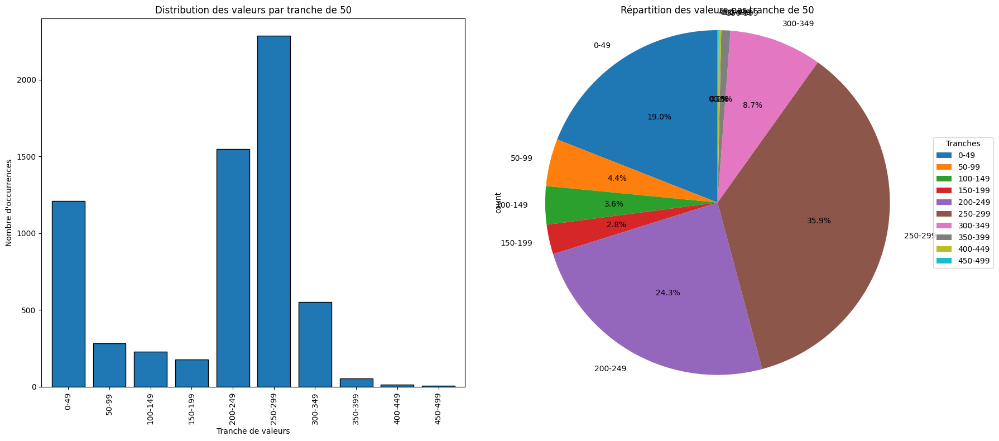

In [264]:
tranche = 50

# Créer des tranches
tranches = [(i, i + tranche - 1) for i in range(0, df_CRO_lang['nb_word'].max(), tranche)]

# Création de la colonne de tranche en utilisant la fonction pd.cut
df_CRO_lang['tranche'] = pd.cut(df_CRO_lang['nb_word'], bins=[i[0] for i in tranches] + [df_CRO_lang['nb_word'].max()], labels=[f"{i[0]}-{i[1]}" for i in tranches])

# Comptage du nombre d'occurrences dans chaque tranche
value_counts_tranches = df_CRO_lang['tranche'].value_counts(sort=False).sort_index()

# Création de la figure et des sous-graphiques
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(18, 8))

# Graphique à barres
value_counts_tranches[value_counts_tranches != 0].plot(kind='bar', edgecolor='black', width=0.8, ax=ax1)
ax1.set_xlabel('Tranche de valeurs')
ax1.set_ylabel('Nombre d\'occurrences')
ax1.set_title(f'Distribution des valeurs par tranche de {tranche}')

# Graphique camembert
value_counts_tranches[value_counts_tranches != 0].plot(kind='pie', autopct='%1.1f%%', startangle=90, ax=ax2)
ax2.axis('equal')  # Assure un camembert circulaire
ax2.set_title(f'Répartition des valeurs par tranche de {tranche}')
ax2.legend(value_counts_tranches[value_counts_tranches != 0].index, title='Tranches', loc='center left', bbox_to_anchor=(1, 0.5))

# Ajustements de la mise en page
plt.tight_layout()

In [265]:
CRO_tranche_query = df_CRO_lang.query('tranche == "0-49"').reset_index()
for index in range(0, len(CRO_tranche_query)):
    print(CRO_tranche_query.CRO[index], '\n')

Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

Titre : Compte rendu d'anatomopathologie
Description macroscop 

Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

Current Model
mistralai/Mistral-7B-Instruct-v0.2
Model
 page
Website 

Titre : Compte rendu d'anatomopathologie
Description macroscopique :
D 

Current Mo

## CRO avec la note de fin 'Ceci est compte-rendu fictif'

In [266]:
def CRO_note_valid(CRO: str) -> int:
    response = 0
    CRO_lower = CRO.lower()
    note_list = ['ceci est un compte rendu fictif', 
                 'ceci est un compte-rendu fictif', 
                 'ce compte rendu est fictionnel',
                 'ce compte rendu est fictif', 
                 'ce compte-rendu est fictif',           
                 'ce document est un compte rendu fictif',
                 'ce document est un compte-rendu fictif',
                 'ce document est un compte rendu opératoire fictif',
                 'ce rapport est fictionnel',
                 'ce rapport opératoire est fictif',
                 'ce rapport est fictif', 
                 'ce rapport anatomopathologique est fictif',
                 'ce résumé est fictif',
                 'ce texte est fictif',
                 'cette note est un compte rendu fictif',
                 'cette étude est un compte rendu fictif',
                 'ce texte est fictionnel',
                 'ce rapport anatomopathologique est fictionnel',
                 'ce ci-dessus est un compte rendu fictif',
                 'ce ci-dessus est un compte-rendu fictif',]
    for note in note_list:
        if note in CRO_lower:
            response = 1
            break
    return response


In [267]:
df_CRO_lang['note_fin'] = df_CRO_lang.CRO.apply(CRO_note_valid)

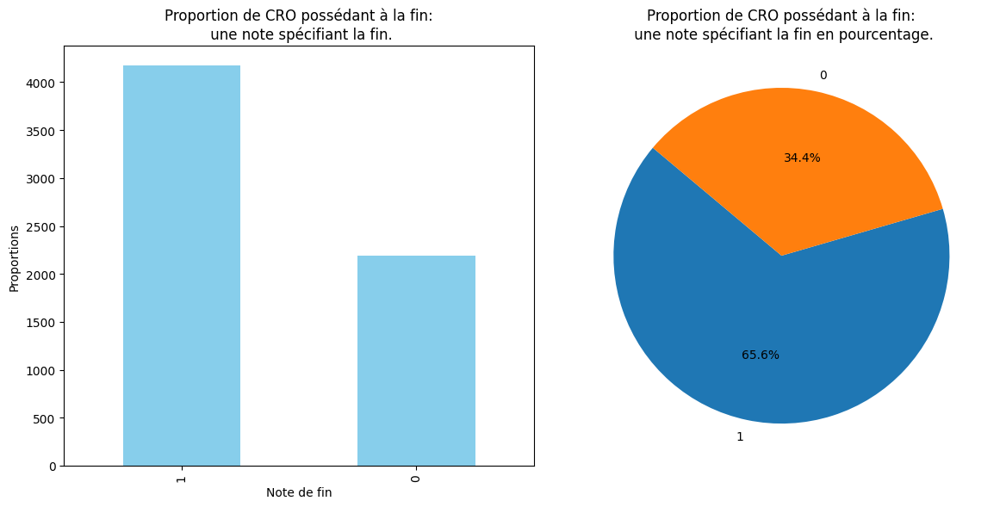

In [268]:
# Comptez les occurrences de chaque valeur dans la colonne
value_counts_note_fin = df_CRO_lang['note_fin'].value_counts()

# Créez un camembert
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 2)
plt.pie(value_counts_note_fin, labels=value_counts_note_fin.index, autopct='%1.1f%%', startangle=140)
plt.title('Proportion de CRO possédant à la fin:\n une note spécifiant la fin en pourcentage.')

# Créez un graphique en barres
plt.subplot(1, 2, 1)
value_counts_note_fin.plot(kind='bar', color='skyblue')
plt.title('Proportion de CRO possédant à la fin:\n une note spécifiant la fin.')
plt.xlabel('Note de fin')
plt.ylabel('Proportions')

plt.tight_layout()

In [269]:
CRO_note_0 = df_CRO_lang.query('note_fin == 0').reset_index()
print('nb de CRO invalide:', len(CRO_note_0), '\n')
for i in range(0, len(CRO_note_0)):
    print('index du CRO', i)
    print(CRO_note_0.CRO[i], '\n')

nb de CRO invalide: 2186 

index du CRO 0
Titre : Compte rendu d'anatomopathologie
Description macroscopique :
Dans ce cas clinique, nous avons reçu une grosseur moyenne de 4 cm de tissu utérin prélevé par laparotomie. L'examen initial révélait une surface grossièrement irregulière du corps utérin, avec présence de nombreuses petites nodules rouges-bruns dispersés sur sa face antérieure et postérieure. La cavité utérine était normale. Les ovaires étaient normaux à l'inspection visuelle.
Description microscopique :
L'examen histologique du tissu utérin montrait la présence de glandes endométriales ectopiques implant 

index du CRO 1
Titre : Compte Rendu d'Anatomopathologie - Lymphome de Burkit
Description Macroscopique :
Le spécimen reçu consistait en une masse tumorale grossièrement ovale, mesurant environ 5 cm x 4 cm x 3 cm, localisée dans la région iliaque gauche. La coupe transversale révélait une consistance molle et hétérogène avec des zones sanguinolentes et autres zones plus sol

# Correspondance CRO et datas

In [270]:
df_CRO.head(5)

,CRO,id_diag,id_med,nir,source,operation,name_patient,address,birthday,name_med,diagnostic
0,Titre : Compte rendu d'anatomopathologie\nDesc...,97,48,2 1996 11 01427 742 22,mistralai/Mistral-7B-Instruct-v0.2,biopsie,Mathilde Michel,"boulevard Becker, 01427 Diallo",03/11/1996,Dr Isaac Lefebvre,endométriose
1,Titre : Compte Rendu d'Anatomopathologie - Lym...,196,99,2 1976 06 35142 767 92,mistralai/Mistral-7B-Instruct-v0.2,exérèse,Laure Pichon,"60, rue Thomas, 35142 Schneider",14/06/1976,Dr Lorraine Bonneau,lymphome de Burkitt
2,Titre : Compte rendu d'anatomopathologie\nDesc...,49,9,2 2002 03 18587 925 67,mistralai/Mistral-7B-Instruct-v0.2,exérèse,Lorraine Fischer,"chemin de Marion, 18587 Lévêque",15/03/2002,Dr Alexandre Da Costa,carcinome à cellules de Merkel
3,Current Model\nmistralai/Mistral-7B-Instruct-v...,36,90,1 1954 07 47869 832 75,mistralai/Mistral-7B-Instruct-v0.2,biopsie,Denis Marques,"avenue Thierry Lamy, 47869 Saint Françoise",11/07/1954,Dr Nicole Maury,carcinome basocellulaire
4,Titre : Compte rendu d'anatomopathologie\nDesc...,277,23,1 1984 10 61183 946 57,mistralai/Mistral-7B-Instruct-v0.2,biopsie,Adrien Guyon,"60, boulevard Carpentier, 61183 PaulVille",01/10/1984,Dr Vincent Leconte,psoriasis


In [271]:
# fonction permettant d'extraire les données des CRO

def trouver_occurrences(texte: str, mot: str) -> int:
    occurrence = []
    index = -1    
    try:
        texte_lower = texte.lower()
        mot_lower = mot.lower()
        while True:
            index = texte_lower.find(mot_lower, index + 1)
            if index == -1:
                break

            occurrence.append(index)
        nb_occurrence = len(occurrence)
        if nb_occurrence >= 1 :
            return nb_occurrence
        else:
            return 0
    except:
        return 0

## Présences du diagnostic dans les CROs

In [272]:
df_CRO_occurrence = df_CRO_lang.copy(deep=True)

df_CRO_occurrence['nb_diag'] = df_CRO_occurrence.apply(lambda row: trouver_occurrences(row['CRO'], row['diagnostic']), axis=1)
df_CRO_occurrence['diag_pr'] = df_CRO_occurrence['nb_diag'].apply(lambda x: 1 if x > 0 else 0)

In [273]:
df_CRO_occurrence.head(5)

,CRO,id_diag,id_med,nir,source,operation,name_patient,address,birthday,name_med,diagnostic,language_proportions,nb_word,tranche,note_fin,nb_diag,diag_pr
0,Titre : Compte rendu d'anatomopathologie\nDesc...,97,48,2 1996 11 01427 742 22,mistralai/Mistral-7B-Instruct-v0.2,biopsie,Mathilde Michel,"boulevard Becker, 01427 Diallo",03/11/1996,Dr Isaac Lefebvre,endométriose,"fr, 1.0",79,50-99,0,0,0
1,Titre : Compte Rendu d'Anatomopathologie - Lym...,196,99,2 1976 06 35142 767 92,mistralai/Mistral-7B-Instruct-v0.2,exérèse,Laure Pichon,"60, rue Thomas, 35142 Schneider",14/06/1976,Dr Lorraine Bonneau,lymphome de Burkitt,"fr, 1.0",271,250-299,0,2,1
2,Titre : Compte rendu d'anatomopathologie\nDesc...,49,9,2 2002 03 18587 925 67,mistralai/Mistral-7B-Instruct-v0.2,exérèse,Lorraine Fischer,"chemin de Marion, 18587 Lévêque",15/03/2002,Dr Alexandre Da Costa,carcinome à cellules de Merkel,"fr, 1.0",255,250-299,1,1,1
3,Current Model\nmistralai/Mistral-7B-Instruct-v...,36,90,1 1954 07 47869 832 75,mistralai/Mistral-7B-Instruct-v0.2,biopsie,Denis Marques,"avenue Thierry Lamy, 47869 Saint Françoise",11/07/1954,Dr Nicole Maury,carcinome basocellulaire,"ca, 1.0",6,0-49,0,0,0
4,Titre : Compte rendu d'anatomopathologie\nDesc...,277,23,1 1984 10 61183 946 57,mistralai/Mistral-7B-Instruct-v0.2,biopsie,Adrien Guyon,"60, boulevard Carpentier, 61183 PaulVille",01/10/1984,Dr Vincent Leconte,psoriasis,"fr, 1.0",250,200-249,1,2,1


## La présence des diagnostics dans les CRO

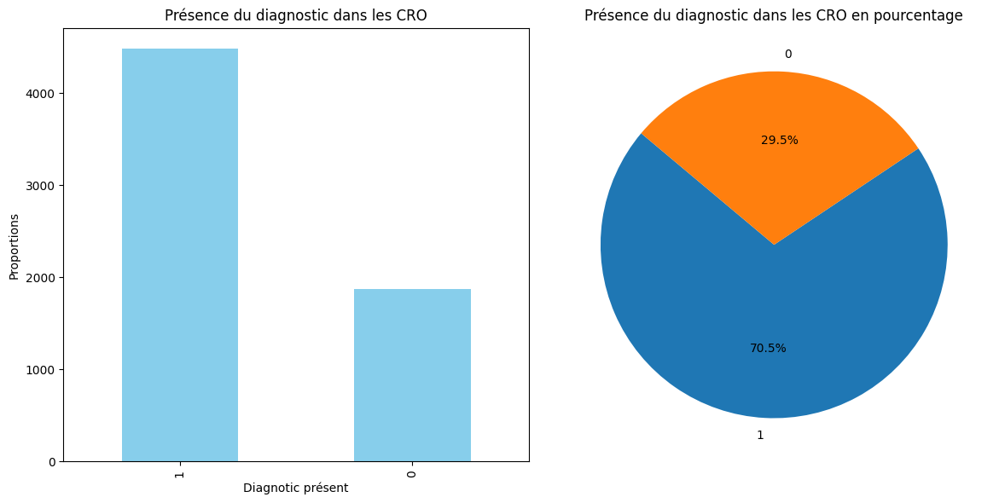

In [274]:
# Présence des diagnostics dans les CRO
value_counts_diag_nb = df_CRO_occurrence['diag_pr'].value_counts()

# Créez un camembert
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 2)
plt.pie(value_counts_diag_nb, labels=value_counts_diag_nb.index, autopct='%1.1f%%', startangle=140)
plt.title('Présence du diagnostic dans les CRO en pourcentage')

# Créez un graphique en barres
plt.subplot(1, 2, 1)
value_counts_diag_nb.plot(kind='bar', color='skyblue')
plt.title('Présence du diagnostic dans les CRO')
plt.xlabel('Diagnotic présent')
plt.ylabel('Proportions')

plt.tight_layout()

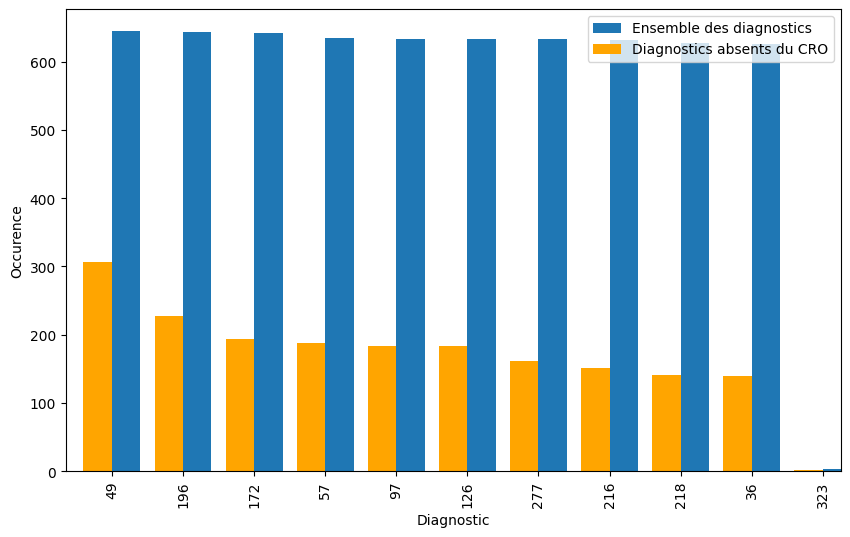

In [275]:
# détermination des diagnostics absents des CRO

diagnostics_absent = df_CRO_occurrence.query('diag_pr == 0')

# Initialisez le graphique
fig, ax = plt.subplots(figsize=(10, 6))

# Graphique de l'ensemble du DataFrame
df_CRO['id_diag'].value_counts().plot(kind='bar', ax=ax, position=0, width=0.4, label='Ensemble des diagnostics')

# Graphique du sous-ensemble filtré
diagnostics_absent['id_diag'].value_counts().plot(kind='bar', ax=ax, position=1, width=0.4, color='orange', label='Diagnostics absents du CRO')
ax.set_xlabel('Diagnostic')
ax.set_ylabel('Occurence')
ax.legend()

In [276]:
diag = 1
query = f'(id_diag == {diag}) and (diag_pr == 0)'
sans_diag = df_CRO_occurrence.query(query).index
print(len(sans_diag), 'CRO concernés')

for index in sans_diag:
    print(index)
    CRO_sans_diag = df_CRO_occurrence.query(query).CRO[index]
    print(CRO_sans_diag, '\n')

0 CRO concernés


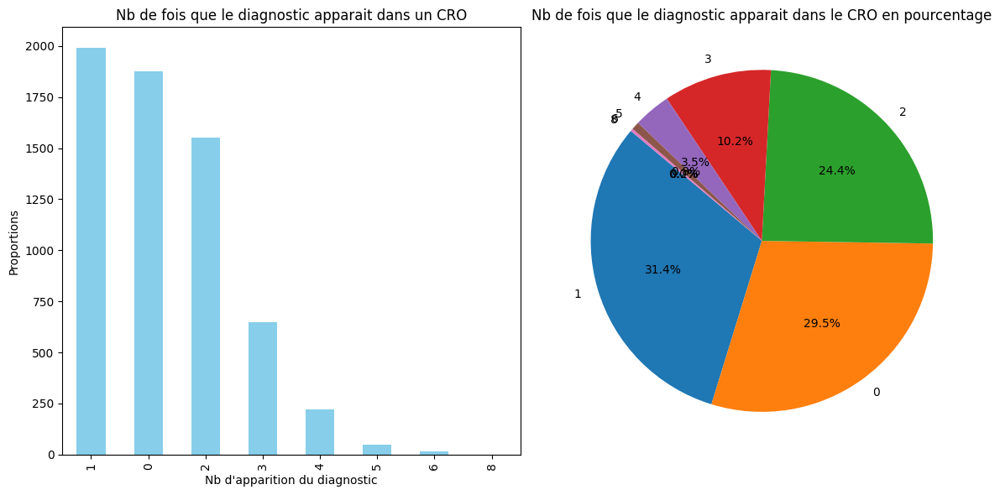

In [277]:
# Comptez les occurrences de chaque valeur dans la colonne
value_counts_diag_occ = df_CRO_occurrence['nb_diag'].value_counts()

# Créez un camembert
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 2)
plt.pie(value_counts_diag_occ, labels=value_counts_diag_occ.index, autopct='%1.1f%%', startangle=140)
plt.title("Nb de fois que le diagnostic apparait dans le CRO en pourcentage")

# Créez un graphique en barres
plt.subplot(1, 2, 1)
value_counts_diag_occ.plot(kind='bar', color='skyblue')
plt.title("Nb de fois que le diagnostic apparait dans un CRO")
plt.xlabel("Nb d'apparition du diagnostic")
plt.ylabel('Proportions')

plt.tight_layout()

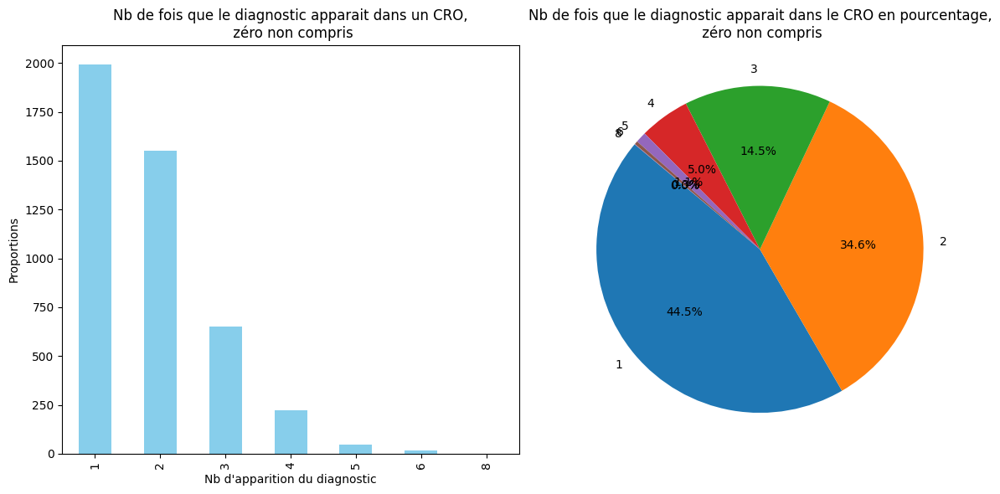

In [278]:
# Comptez les occurrences de chaque valeur dans la colonne
value_counts_diag_occ_sans_med = df_CRO_occurrence.query('nb_diag != 0')['nb_diag'].value_counts()

# Créez un camembert
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 2)
plt.pie(value_counts_diag_occ_sans_med, labels=value_counts_diag_occ_sans_med.index, autopct='%1.1f%%', startangle=140)
plt.title("Nb de fois que le diagnostic apparait dans le CRO en pourcentage,\n zéro non compris")

# Créez un graphique en barres
plt.subplot(1, 2, 1)
value_counts_diag_occ_sans_med.plot(kind='bar', color='skyblue')
plt.title("Nb de fois que le diagnostic apparait dans un CRO,\n zéro non compris")
plt.xlabel("Nb d'apparition du diagnostic")
plt.ylabel('Proportions')

plt.tight_layout()

In [279]:
CRO_occ_query = df_CRO_occurrence.query('nb_diag == 6').reset_index()
for index in range(0, len(CRO_occ_query)):
    print(CRO_occ_query.CRO[index], '\n')

Titre : Compte rendu d'anatomopathologie
Description macroscopique :
Dans le cadre de cette étude, nous présentons ici le résultat anatomopathologique d'une biopsie intestinale obtenue auprès d'un patient atteint de Maladie de Behçet. L'examen initial du spécimen révélait une masse inflammatoire irregulièrement contournée, mesurant environ 3 cm de long sur 2 cm de large, localisée au niveau du côlon sigmoïde. La paroi intestinale était épaissie et hétérogène, avec des zones sanguinolentes et des ulcères superficiels visibles à l'œil nu. La muqueuse apparaissait hyperémisée et friable.
Description microscopique :
L'analyse histologique montrait une infiltration inflammatorye profonde du muscle lisse et ponctuellement du sous-muqueux. Des granulomes non caséous étaient observés dans les tissus musculaires et associés à des vaisseaux veineux engorgés et thrombosés. Les cellules géantes multinucleées présentaient des vacuoles lipidiques et des phagocytes contenant des bactériies gram négat

# Répartition en type de prélèvement

In [280]:
df_CRO_type = df_CRO_occurrence.copy(deep=True)

In [281]:
df_CRO_type['operation'].unique()

array(['biopsie', 'exérèse'], dtype=object)

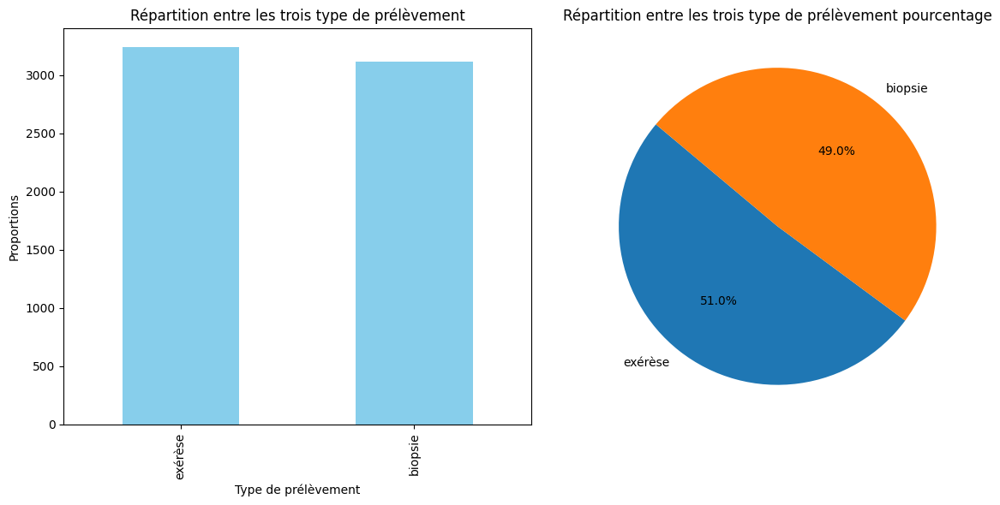

In [282]:
# Comptez les occurrences de chaque valeur dans la colonne
value_counts_type = df_CRO_type['operation'].value_counts()

# Créez un camembert
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 2)
plt.pie(value_counts_type, labels=value_counts_type.index, autopct='%1.1f%%', startangle=140)
plt.title("Répartition entre les trois type de prélèvement pourcentage")

# Créez un graphique en barres
plt.subplot(1, 2, 1)
value_counts_type.plot(kind='bar', color='skyblue')
plt.title("Répartition entre les trois type de prélèvement")
plt.xlabel('Type de prélèvement')
plt.ylabel('Proportions')

plt.tight_layout()

# CRO valides

## Filtration vis à vis des différents paramètres d'un CRO valide

### La langue

Lors de l'EDA, il apparait que certain CRO ne sont pas en français, ou pas entièrement. Ainsi pour s'assurer que notre modèle Spacy s'entraine correctement, seuls les CRO indiqués comme fr, 1.0 sont conservés.

In [283]:
df_CRO_lang.head(5)

,CRO,id_diag,id_med,nir,source,operation,name_patient,address,birthday,name_med,diagnostic,language_proportions,nb_word,tranche,note_fin
0,Titre : Compte rendu d'anatomopathologie\nDesc...,97,48,2 1996 11 01427 742 22,mistralai/Mistral-7B-Instruct-v0.2,biopsie,Mathilde Michel,"boulevard Becker, 01427 Diallo",03/11/1996,Dr Isaac Lefebvre,endométriose,"fr, 1.0",79,50-99,0
1,Titre : Compte Rendu d'Anatomopathologie - Lym...,196,99,2 1976 06 35142 767 92,mistralai/Mistral-7B-Instruct-v0.2,exérèse,Laure Pichon,"60, rue Thomas, 35142 Schneider",14/06/1976,Dr Lorraine Bonneau,lymphome de Burkitt,"fr, 1.0",271,250-299,0
2,Titre : Compte rendu d'anatomopathologie\nDesc...,49,9,2 2002 03 18587 925 67,mistralai/Mistral-7B-Instruct-v0.2,exérèse,Lorraine Fischer,"chemin de Marion, 18587 Lévêque",15/03/2002,Dr Alexandre Da Costa,carcinome à cellules de Merkel,"fr, 1.0",255,250-299,1
3,Current Model\nmistralai/Mistral-7B-Instruct-v...,36,90,1 1954 07 47869 832 75,mistralai/Mistral-7B-Instruct-v0.2,biopsie,Denis Marques,"avenue Thierry Lamy, 47869 Saint Françoise",11/07/1954,Dr Nicole Maury,carcinome basocellulaire,"ca, 1.0",6,0-49,0
4,Titre : Compte rendu d'anatomopathologie\nDesc...,277,23,1 1984 10 61183 946 57,mistralai/Mistral-7B-Instruct-v0.2,biopsie,Adrien Guyon,"60, boulevard Carpentier, 61183 PaulVille",01/10/1984,Dr Vincent Leconte,psoriasis,"fr, 1.0",250,200-249,1


In [284]:
df_CRO_filtre_1 = df_CRO_type.query('language_proportions == "fr, 1.0"')
print('Taille originale du df CRO:', len(df_CRO_type), 'CRO,')
print('taille après filtrage de la langue (fr 100%):', len(df_CRO_filtre_1), 'CRO,')
print('soit une perte de', round((len(df_CRO_type) - len(df_CRO_filtre_1)) * 100 / len(df_CRO_type), 2), '%.')

Taille originale du df CRO: 6357 CRO,
taille après filtrage de la langue (fr 100%): 5293 CRO,
soit une perte de 16.74 %.


### La présence de toutes les données

Pour l'entrainement de Spacy, il faut déterminer les index des entitées recherchées dans les CRO. Pour certain, ils sont simplement absent, car la génération de la réponse s'est stoppée trop tôt, pour d'autres, c'est la langue, mais le filtre précédent résout ce problème. Ainsi, seuls les CRO ayant une note de 6, qui correspont aux différentes entitées qui seront recherchés, sont conservés.

In [285]:
df_CRO_filtre_2 = df_CRO_filtre_1.query('diag_pr == 1')
print('Taille après filtrage de la note (6/6):', len(df_CRO_filtre_2), 'CRO,')
print('soit une perte de', round((len(df_CRO_type) - len(df_CRO_filtre_2)) * 100 / len(df_CRO_type), 2), '% par rapport au df sans filtre.')

Taille après filtrage de la note (6/6): 4468 CRO,
soit une perte de 29.72 % par rapport au df sans filtre.


### La présence de la note de fin

In [286]:
df_CRO_filtre_3 = df_CRO_filtre_2.query('note_fin == 1')
print('Taille après filtrage de la présence de la note de fin:', len(df_CRO_filtre_3), 'CRO,')
print('soit une perte de', round((len(df_CRO_type) - len(df_CRO_filtre_3)) * 100 / len(df_CRO_type), 2), '% par rapport au df sans filtre.')

Taille après filtrage de la présence de la note de fin: 3971 CRO,
soit une perte de 37.53 % par rapport au df sans filtre.


In [287]:
df_CRO_filtre_3_reinit = df_CRO_filtre_3.reset_index(drop=True)
for index in range(0, len(df_CRO_filtre_3_reinit) -1):
    print(df_CRO_filtre_3_reinit.CRO[index], '\n')

Titre : Compte rendu d'anatomopathologie
Description macroscopique :
Dans le cadre de cette étude, nous examinons une masse palpée durant l'intervention chirurgicale du patient X, localisée sur la face postérieure du plancher buccal droit. La taille approximative de la masse était de 2 centimètres. L'aspect cutané était irregulier, avec une teinte rouge-brune et une surface irrégulièremment nodulaire. Aucune ulcération ni nécrose apparentes. Les marges de résection étaient libres.
Description microscopique :
L'examen histologique révèle un infiltrat tumoral formé par des cellules polymorphes, épithélioïdes ou plasmocytoides, avec nucléus ovalaire, finement granuleux, et cytoplasme pauvre en matière granulomateuse. Des mitoses sont observées fréquemment. Les cellules forment des groupes cohésifs et des cordons, ainsi qu'une architecture glandulaire. Des kystes et des nécrès sont présents. Il existe une importante infiltration inflammatoire associée, principalement composée de lymphocyte

# EDA après filtration

## La source (après filtration)

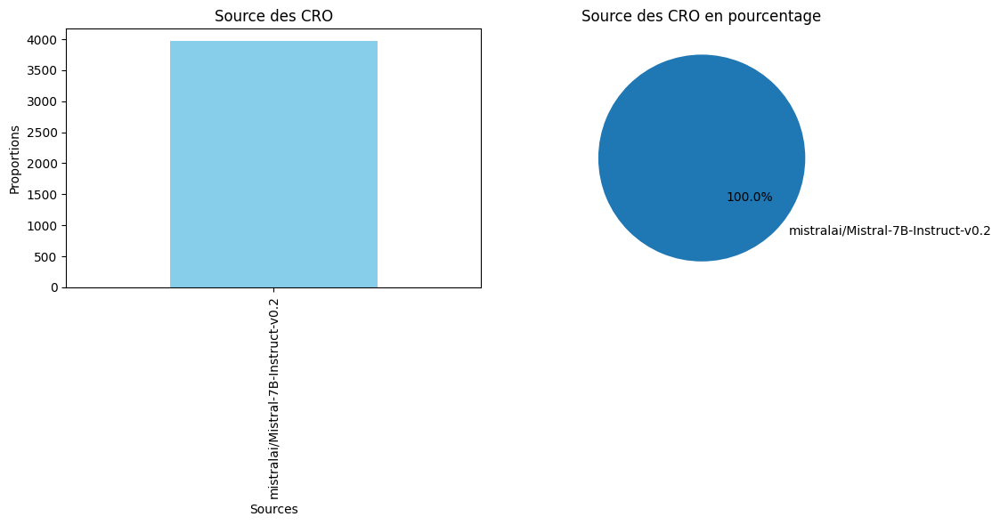

In [288]:
# Comptez les occurrences de chaque valeur dans la colonne
value_counts = df_CRO_filtre_3_reinit['source'].value_counts()

# Créez un camembert
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 2)
plt.pie(value_counts, labels=value_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Source des CRO en pourcentage')

# Créez un graphique en barres
plt.subplot(1, 2, 1)
value_counts.plot(kind='bar', color='skyblue')
plt.title('Source des CRO')
plt.xlabel('Sources')
plt.ylabel('Proportions')

plt.tight_layout()

## Le type de prélèvement (après filtrage)

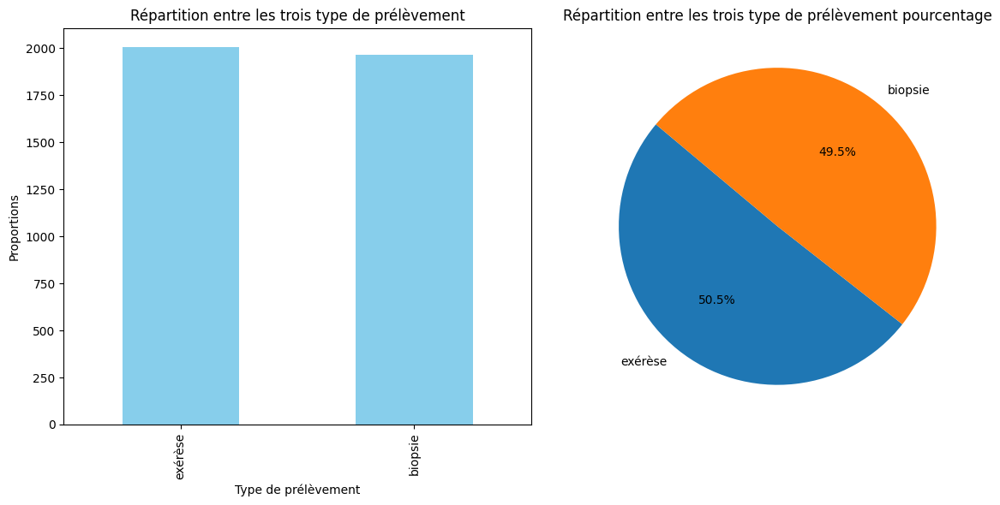

In [289]:
# Comptez les occurrences de chaque valeur dans la colonne
value_counts = df_CRO_filtre_3_reinit['operation'].value_counts()

# Créez un camembert
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 2)
plt.pie(value_counts, labels=value_counts.index, autopct='%1.1f%%', startangle=140)
plt.title("Répartition entre les trois type de prélèvement pourcentage")

# Créez un graphique en barres
plt.subplot(1, 2, 1)
value_counts.plot(kind='bar', color='skyblue')
plt.title("Répartition entre les trois type de prélèvement")
plt.xlabel('Type de prélèvement')
plt.ylabel('Proportions')

plt.tight_layout()

## Les anatomopathologistes (après filtration)

In [290]:
nb_meds_after_filter = df_CRO_filtre_3_reinit.id_med.unique()
print("nb d'anatomopathologiste qui apparaissent dans les CRO après filtration:", len(nb_meds_after_filter))

nb d'anatomopathologiste qui apparaissent dans les CRO après filtration: 100


## Les patients (après filtration)

In [291]:
nb_patients_after_filters = df_CRO_filtre_3_reinit.nir.unique()
print("nb de patient qui apparaissent dans les CRO après filtration:", len(nb_patients_after_filters))

nb de patient qui apparaissent dans les CRO après filtration: 400


## Les diagnostics (après filtration)

In [292]:
nb_diags = df_CRO_filtre_3_reinit.id_diag.unique()
print("nb de diagnostics qui apparaissent dans les CRO:", len(nb_diags))

nb de diagnostics qui apparaissent dans les CRO: 11


Text(0, 0.5, 'Occurence')

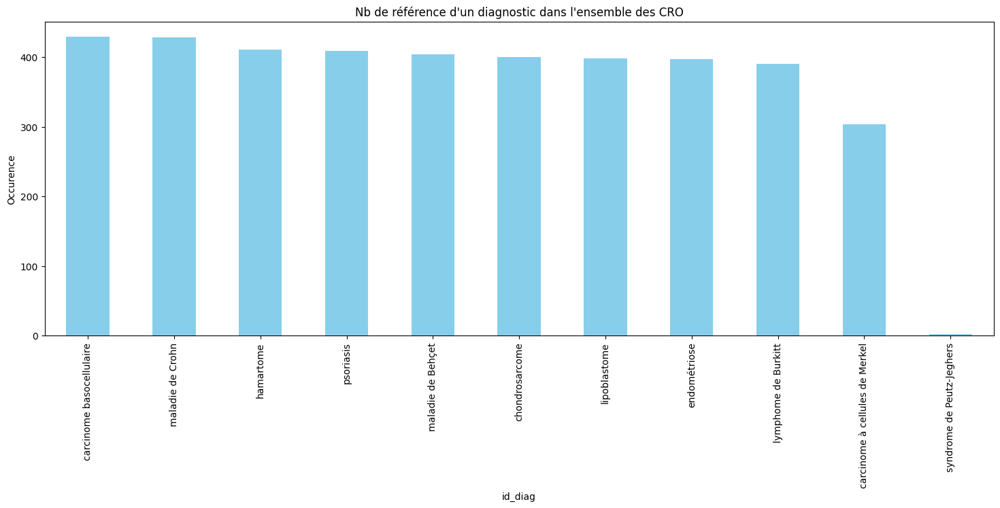

In [293]:
value_counts = df_CRO_filtre_3_reinit['diagnostic'].value_counts()

plt.figure(figsize=(18, 6))
value_counts.plot(kind='bar', color='skyblue')
plt.title("Nb de référence d'un diagnostic dans l'ensemble des CRO")
plt.xlabel('id_diag')
plt.ylabel('Occurence')

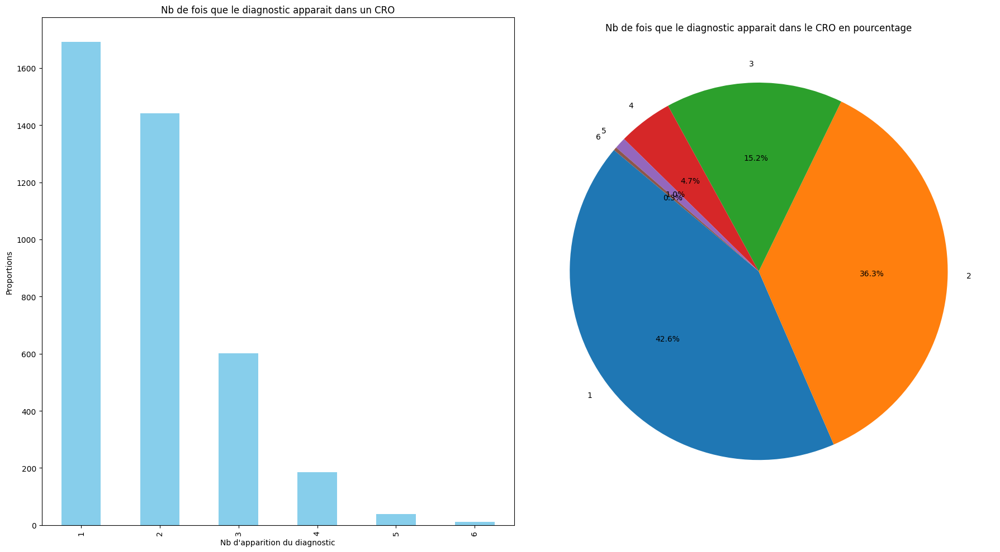

In [294]:
# Comptez les occurrences de chaque valeur dans la colonne
value_counts = df_CRO_filtre_3_reinit['nb_diag'].value_counts()

# Créez un camembert
plt.figure(figsize=(18, 10))
plt.subplot(1, 2, 2)
plt.pie(value_counts, labels=value_counts.index, autopct='%1.1f%%', startangle=140)
plt.title("Nb de fois que le diagnostic apparait dans le CRO en pourcentage")

# Créez un graphique en barres
plt.subplot(1, 2, 1)
value_counts.plot(kind='bar', color='skyblue')
plt.title("Nb de fois que le diagnostic apparait dans un CRO")
plt.xlabel("Nb d'apparition du diagnostic")
plt.ylabel('Proportions')

plt.tight_layout()

## Répartition par nb de mots (après filtration)

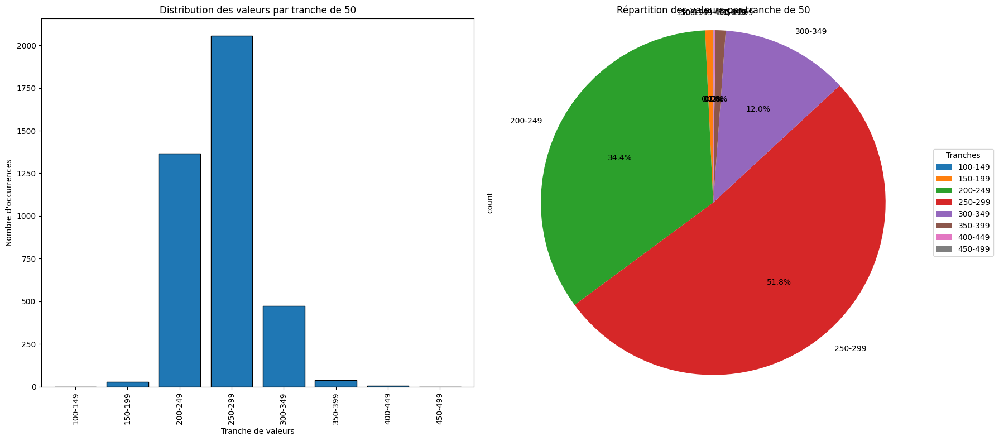

In [295]:
# Comptage du nombre d'occurrences dans chaque tranche
comptage_tranches_filtration = df_CRO_filtre_3_reinit['tranche'].value_counts(sort=False).sort_index()

# Création de la figure et des sous-graphiques
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(18, 8))

# Graphique à barres
comptage_tranches_filtration[comptage_tranches_filtration != 0].plot(kind='bar', edgecolor='black', width=0.8, ax=ax1)
ax1.set_xlabel('Tranche de valeurs')
ax1.set_ylabel('Nombre d\'occurrences')
ax1.set_title(f'Distribution des valeurs par tranche de {tranche}')

# Graphique camembert
comptage_tranches_filtration[comptage_tranches_filtration != 0].plot(kind='pie', autopct='%1.1f%%', startangle=90, ax=ax2)
ax2.axis('equal')  # Assure un camembert circulaire
ax2.set_title(f'Répartition des valeurs par tranche de {tranche}')
ax2.legend(comptage_tranches_filtration[comptage_tranches_filtration != 0].index, title='Tranches', loc='center left', bbox_to_anchor=(1, 0.5))

# Ajustements de la mise en page
plt.tight_layout()

In [296]:
from sqlalchemy import create_engine
import os

def send_to_SQL(db_table, df):
    # Paramètres de connexion à la base de données MySQL
    db_username = os.getenv('DB_USER')
    db_password = os.getenv('DB_PASSWORD')
    db_host = os.getenv('DB_HOST')
    db_port = os.getenv('DB_PORT')
    db_database = os.getenv('DB_DATABASE')

    # Créer une connexion à la base de données MySQL avec SQLAlchemy
    engine = create_engine(f"mysql+pymysql://{db_username}:{db_password}@{db_host}:{db_port}/{db_database}")

    # # Envoyer le DataFrame en tant que table MySQL
    df.to_sql(name=db_table, con=engine, index=False, if_exists='replace')

    # Récupérer les données de la table MySQL
    query = f"SELECT * FROM {db_table}"
    df_from_mysql = pd.read_sql(query, con=engine)

    # Afficher le DataFrame récupéré depuis MySQL
    print("DataFrame récupéré depuis MySQL:")
    print(df_from_mysql)

In [297]:
# df_CRO_filtre_3_reinit.to_csv(f'{file}\df_CRO_filter.csv', index=False, sep=';')

In [298]:
# send_to_SQL('CRO', df_CRO_filtre_3_reinit[['CRO', 'id_diag', 'id_med', 'nir', 'source', 'operation']])